In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.decomposition import PCA

from matplotlib import rc

plt.rcParams["axes.unicode_minus"] = False
rc("font", family = "Arial Unicode MS")
get_ipython().run_line_magic("matplotlib","inline")

In [4]:
question_raw = pd.read_csv('../../data/data-final.csv', sep='\t')
personality_raw = pd.read_csv('../../data/2018-personality-data.csv')
ratings_raw = pd.read_csv('../../data/2018_ratings.csv')

In [5]:
question = question_raw.copy()
personality = personality_raw.copy()
ratings = ratings_raw.copy()

In [6]:
question.columns.values

array(['EXT1', 'EXT2', 'EXT3', 'EXT4', 'EXT5', 'EXT6', 'EXT7', 'EXT8',
       'EXT9', 'EXT10', 'EST1', 'EST2', 'EST3', 'EST4', 'EST5', 'EST6',
       'EST7', 'EST8', 'EST9', 'EST10', 'AGR1', 'AGR2', 'AGR3', 'AGR4',
       'AGR5', 'AGR6', 'AGR7', 'AGR8', 'AGR9', 'AGR10', 'CSN1', 'CSN2',
       'CSN3', 'CSN4', 'CSN5', 'CSN6', 'CSN7', 'CSN8', 'CSN9', 'CSN10',
       'OPN1', 'OPN2', 'OPN3', 'OPN4', 'OPN5', 'OPN6', 'OPN7', 'OPN8',
       'OPN9', 'OPN10', 'EXT1_E', 'EXT2_E', 'EXT3_E', 'EXT4_E', 'EXT5_E',
       'EXT6_E', 'EXT7_E', 'EXT8_E', 'EXT9_E', 'EXT10_E', 'EST1_E',
       'EST2_E', 'EST3_E', 'EST4_E', 'EST5_E', 'EST6_E', 'EST7_E',
       'EST8_E', 'EST9_E', 'EST10_E', 'AGR1_E', 'AGR2_E', 'AGR3_E',
       'AGR4_E', 'AGR5_E', 'AGR6_E', 'AGR7_E', 'AGR8_E', 'AGR9_E',
       'AGR10_E', 'CSN1_E', 'CSN2_E', 'CSN3_E', 'CSN4_E', 'CSN5_E',
       'CSN6_E', 'CSN7_E', 'CSN8_E', 'CSN9_E', 'CSN10_E', 'OPN1_E',
       'OPN2_E', 'OPN3_E', 'OPN4_E', 'OPN5_E', 'OPN6_E', 'OPN7_E',
       'OPN8_E', 'OPN9_

In [7]:
print('Number of participants: ', len(question))
print('Is there any missing value? ', question.isnull().values.any())
print('How many missing values? ', question.isnull().values.sum())
print('Number of participants after eliminating missing values: ', len(question))

Number of participants:  1015341
Is there any missing value?  True
How many missing values?  186358
Number of participants after eliminating missing values:  1015341


In [8]:
#missing values delete
question.dropna(inplace = True)

In [9]:
question.drop(question.columns[50:100], axis=1, inplace=True)

In [10]:
question.columns.values

array(['EXT1', 'EXT2', 'EXT3', 'EXT4', 'EXT5', 'EXT6', 'EXT7', 'EXT8',
       'EXT9', 'EXT10', 'EST1', 'EST2', 'EST3', 'EST4', 'EST5', 'EST6',
       'EST7', 'EST8', 'EST9', 'EST10', 'AGR1', 'AGR2', 'AGR3', 'AGR4',
       'AGR5', 'AGR6', 'AGR7', 'AGR8', 'AGR9', 'AGR10', 'CSN1', 'CSN2',
       'CSN3', 'CSN4', 'CSN5', 'CSN6', 'CSN7', 'CSN8', 'CSN9', 'CSN10',
       'OPN1', 'OPN2', 'OPN3', 'OPN4', 'OPN5', 'OPN6', 'OPN7', 'OPN8',
       'OPN9', 'OPN10', 'dateload', 'screenw', 'screenh', 'introelapse',
       'testelapse', 'endelapse', 'IPC', 'country',
       'lat_appx_lots_of_err', 'long_appx_lots_of_err'], dtype=object)

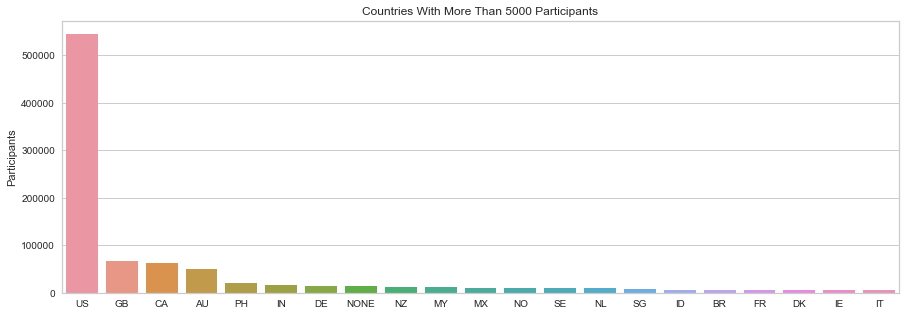

In [11]:
countries = pd.DataFrame(question['country'].value_counts())
countries_5000 = countries[countries['country'] >= 5000]
plt.figure(figsize=(15,5))
sns.barplot(data=countries_5000, x=countries_5000.index, y='country')
plt.title('Countries With More Than 5000 Participants')
plt.ylabel('Participants');

In [12]:
ext_questions = {'EXT1' : '파티의 주인공은 나다.',
                 'EXT2' : '나는 말을 많이 하지 않는다.',
                 'EXT3' : '무리에 있으면 편안한 느낌을 받는다.',
                 'EXT4' : '앞에 나서는 것을 좋아하지 않는다.',
                 'EXT5' : '나는 대화를 먼저 시작한다.',
                 'EXT6' : '나는 대화할 주제가 별로 없다.',
                 'EXT7' : '나는 파티에서 다양한 사람들과 대화를 한다.',
                 'EXT8' : '나는 이목을 끄는 것을 좋아하지 않는다.',
                 'EXT9' : '나는 내가 관심의 대상이 되는 것은 상관없다.',
                 'EXT10': '나는 낯선사람들 앞에서 조용하다.'}

est_questions = {'EST1' : '나는 쉽게 스트레스를 받는다.',
                 'EST2' : '대부분의 시간에 나는 안정되어 있다.',
                 'EST3' : '나는 걱정이 많다.',
                 'EST4' : '나는 우울한 적이 거의 없다.',
                 'EST5' : '나는 쉽게 불안해진다.',
                 'EST6' : '나는 쉽게 화난다.',
                 'EST7' : '나는 기분이 자주 변한다.',
                 'EST8' : '나는 감정의 기복이 잦다.',
                 'EST9' : '나는 쉽게 짜증을 낸다.',
                 'EST10': '나는 종종 우울하다.'}

agr_questions = {'AGR1' : '나는 다른 사람들에게 별로 신경 쓰지 않는다.',
                 'AGR2' : '나는 사람들에게 관심이 많다.',
                 'AGR3' : '나는 사람들을 모욕한다.',
                 'AGR4' : '나는 다른 사람들의 감정에 공감한다.',
                 'AGR5' : '나는 다른 사람의 문제에는 관심이 없다.',
                 'AGR6' : '나는 마음이 부드럽다.',
                 'AGR7' : '나는 다른 사람에게 별로 관심이 없다.',
                 'AGR8' : '나는 다른 사람들을 위해 시간을 낸다.',
                 'AGR9' : '나는 다른 사람들의 감정을 느낀다.',
                 'AGR10': '나는 사람들을 편안하게 만든다.'}

csn_questions = {'CSN1' : '나는 항상 준비되어 있다.',
                 'CSN2' : '나는 내 물건들을 주변에 두고 다닌다.',
                 'CSN3' : '나는 세부적인 것에 신경을 쓴다.',
                 'CSN4' : '나는 일을 망친다.',
                 'CSN5' : '나는 일을 바로 끝낸다.',
                 'CSN6' : '나는 종종 물건을 제자리에 갖다 놓는 것을 잊어버린다.',
                 'CSN7' : '나는 질서를 좋아한다.',
                 'CSN8' : 'I나는 내 의무를 회피한다.',
                 'CSN9' : '나는 내 스케쥴을 따른다.',
                 'CSN10' : '나는 내 일에 대해 엄격하다.'}

opn_questions = {'OPN1' : '나는 어휘가 풍부하다.',
                 'OPN2' : '추상적인 아이디어를 이해하는데 어렵다.',
                 'OPN3' : '나는 생생한 상상력을 가지고 있다.',
                 'OPN4' : '나는 추상적인 아이디어에는 관심이 없다.',
                 'OPN5' : '나는 훌륭한 아이디어를 가지고 있다.',
                 'OPN6' : '나는 좋은 상상력을 가지고 있지 않다.',
                 'OPN7' : '나는 이해력이 빠르다.',
                 'OPN8' : '나는 어려운 단어를 사용한다.',
                 'OPN9' : '나는 사물을 성찰하는 시간을 갖는다.',
                 'OPN10': '나는 아이디어로 가득 차 있다.'}

# Group Names and Columns
EXT = [column for column in question if column.startswith('EXT')]
EST = [column for column in question if column.startswith('EST')]
AGR = [column for column in question if column.startswith('AGR')]
CSN = [column for column in question if column.startswith('CSN')]
OPN = [column for column in question if column.startswith('OPN')]

In [13]:
def vis_questions(groupname, questions):
    plt.figure(figsize=(40,60))
    for i in range(1, 11):
        plt.subplot(10,2,i)
        sns.countplot(x=groupname[i-1], edgecolor="black", data=question)
        sns.despine()
        plt.title(questions[groupname[i-1]], fontsize=18)
    plt.tight_layout()
    plt.show()

Q&As Related to Extroversion Personality


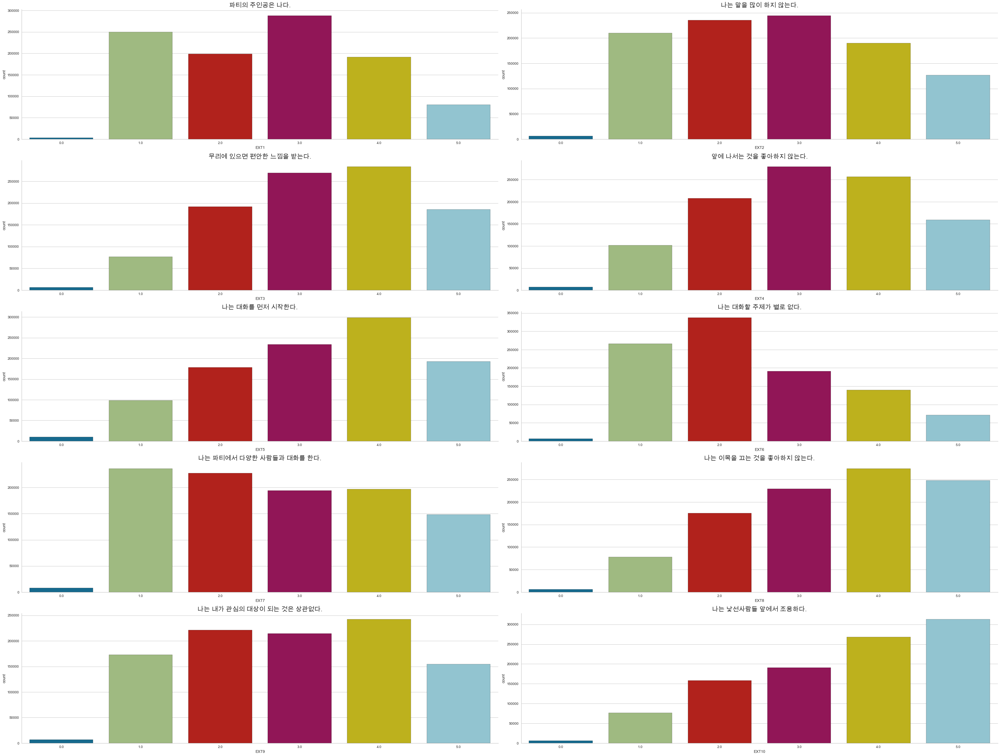

In [14]:
print('Q&As Related to Extroversion Personality')
vis_questions(EXT, ext_questions)

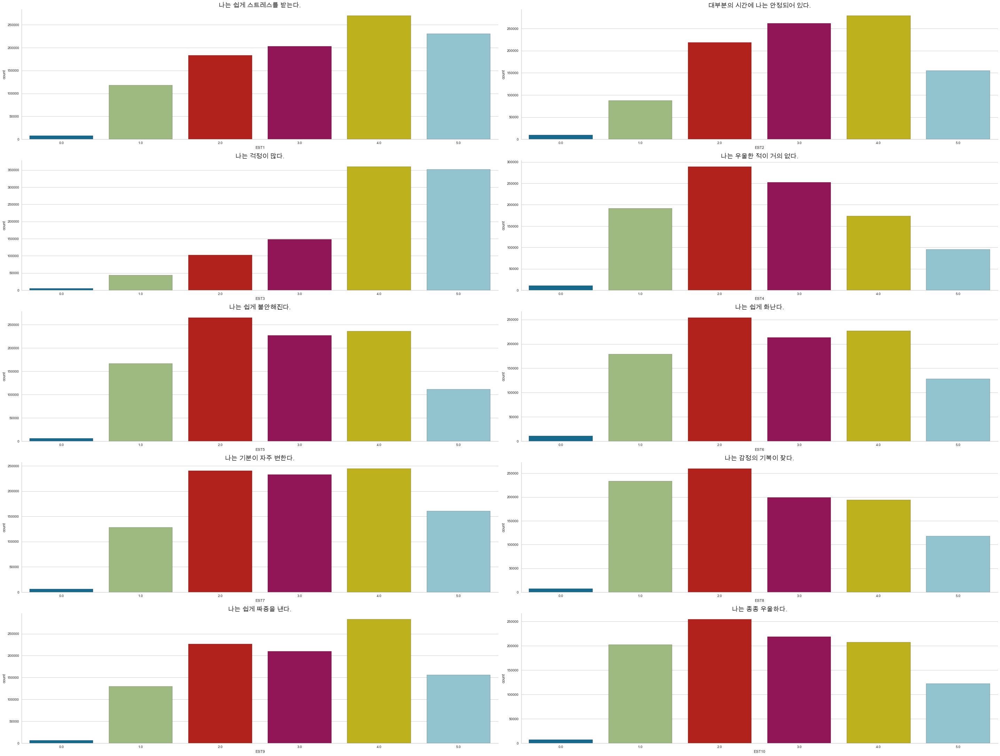

In [15]:
vis_questions(EST, est_questions)

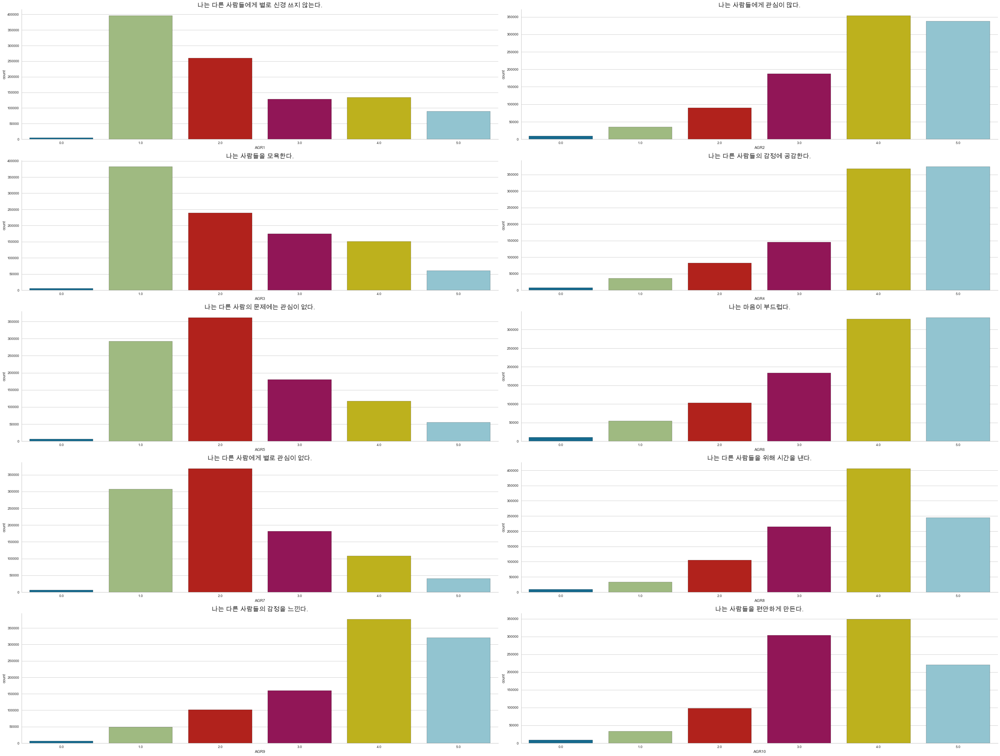

In [16]:
vis_questions(AGR, agr_questions)

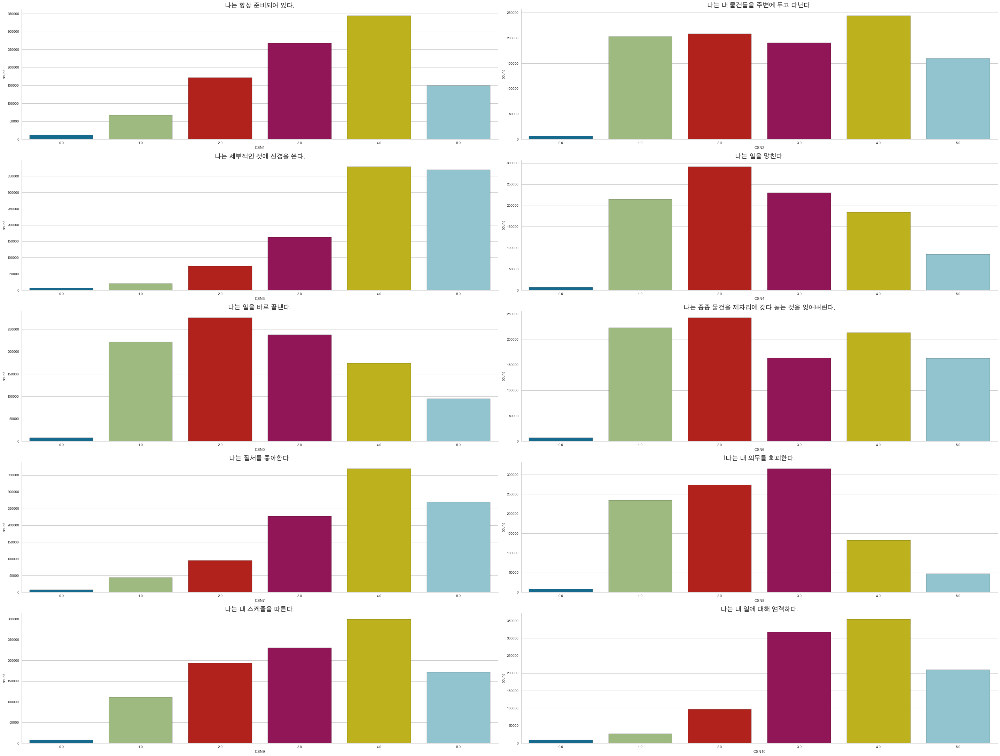

In [17]:
vis_questions(CSN, csn_questions)

In [18]:
# 각 문항별 상관분석

In [19]:
def vis_corr(groupname):
    data = question[groupname]
    corr_values = data.corr(method='pearson')
    plt.figure(figsize=(40,40))
    sns.set(font_scale=2.0) # 레이블의 폰트 사이즈를 조정
    sns.heatmap(corr_values,# 데이터
                #cbar = True, # 오른쪽 컬러 막대 출력 여부
                annot = True, # 차트에 상관계수 값을 보여줄 것인지 여부
                annot_kws={'size' : 40}, # 숫자 출력 시 숫자 크기 조절
                fmt = '.2f', # 숫자의 출력 소수점자리 개수 조절
                square = 'True') # 차트를 정사각형으로 할 것인지
    plt.tight_layout()
    plt.show()

In [20]:
[question[EXT].corr() > 0.5]

[        EXT1   EXT2   EXT3   EXT4   EXT5   EXT6   EXT7   EXT8   EXT9  EXT10
 EXT1    True  False  False  False  False  False   True  False  False  False
 EXT2   False   True  False   True  False   True  False  False  False  False
 EXT3   False  False   True  False   True  False   True  False  False  False
 EXT4   False   True  False   True  False  False  False  False  False   True
 EXT5   False  False   True  False   True  False   True  False  False  False
 EXT6   False   True  False  False  False   True  False  False  False  False
 EXT7    True  False   True  False   True  False   True  False  False  False
 EXT8   False  False  False  False  False  False  False   True  False  False
 EXT9   False  False  False  False  False  False  False  False   True  False
 EXT10  False  False  False   True  False  False  False  False  False   True]

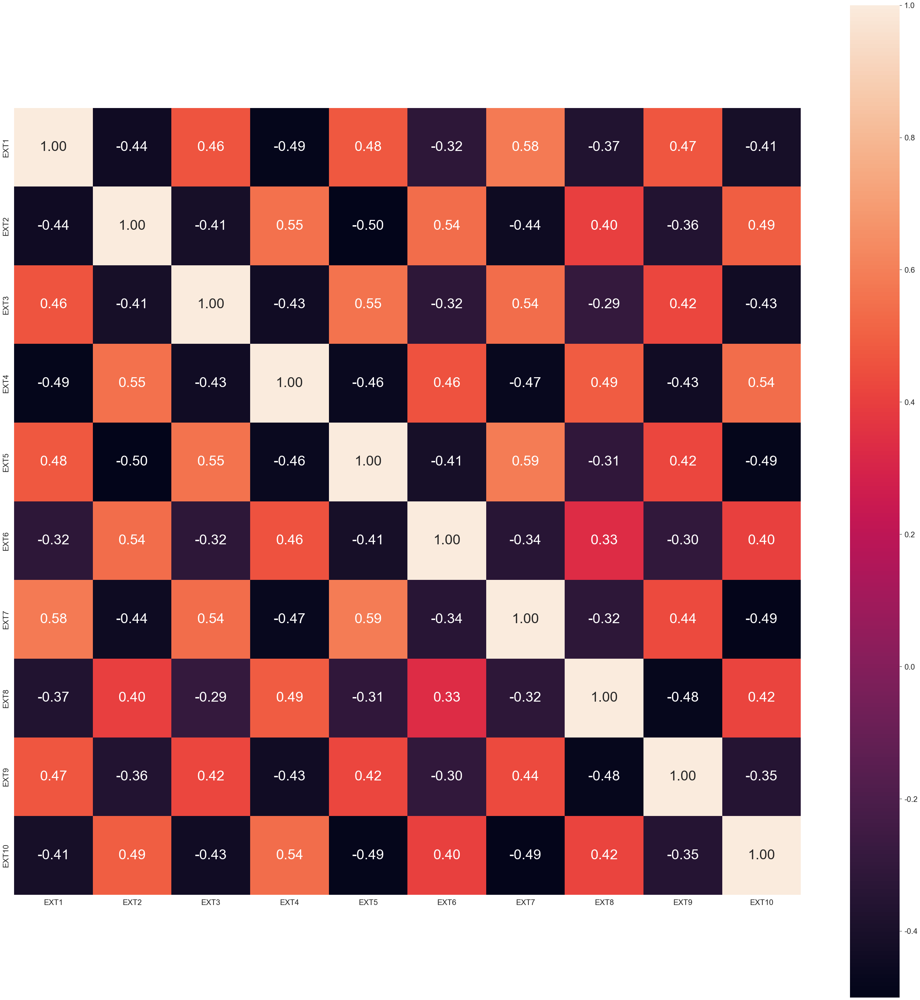

In [21]:
vis_corr(EXT)

In [22]:
[question[EST].corr() > 0.5]

[        EST1   EST2   EST3   EST4   EST5   EST6   EST7   EST8   EST9  EST10
 EST1    True  False   True  False  False   True  False  False  False  False
 EST2   False   True  False  False  False  False  False  False  False  False
 EST3    True  False   True  False  False  False  False  False  False  False
 EST4   False  False  False   True  False  False  False  False  False  False
 EST5   False  False  False  False   True  False  False  False  False  False
 EST6    True  False  False  False  False   True   True   True   True  False
 EST7   False  False  False  False  False   True   True   True   True  False
 EST8   False  False  False  False  False   True   True   True   True   True
 EST9   False  False  False  False  False   True   True   True   True  False
 EST10  False  False  False  False  False  False  False   True  False   True]

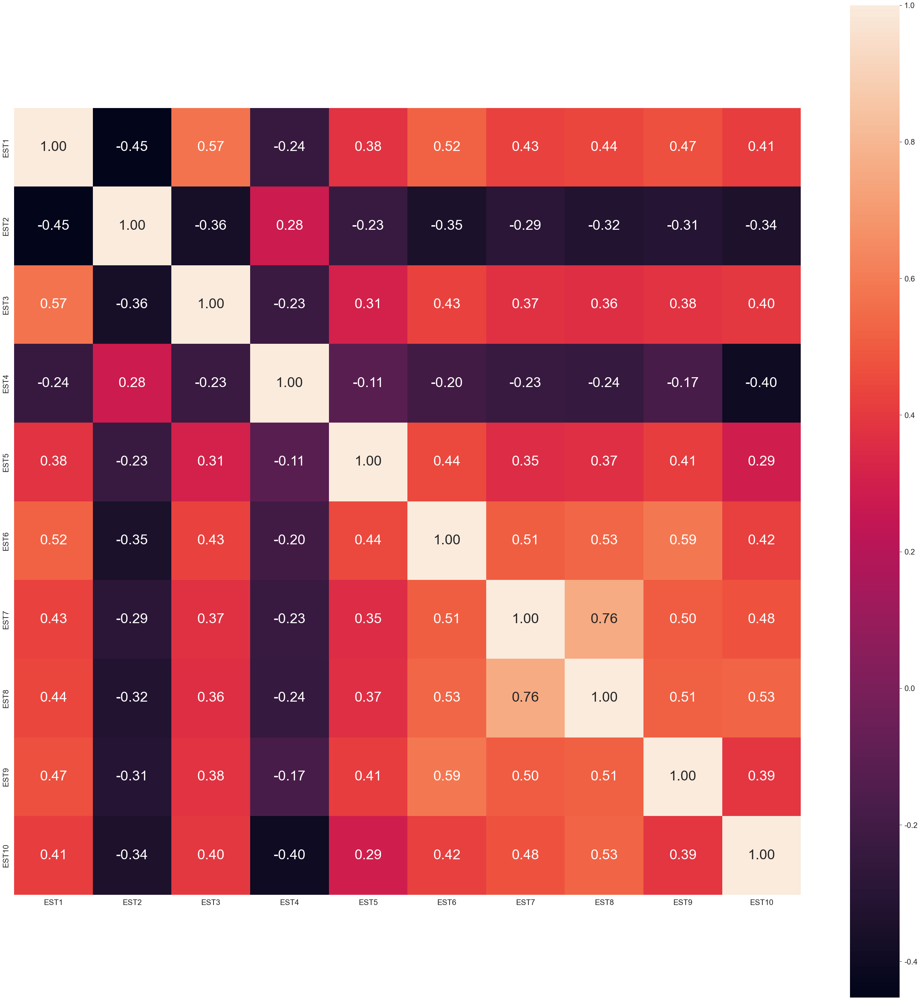

In [23]:
vis_corr(EST)

In [24]:
[question[AGR].corr() > 0.5]

[        AGR1   AGR2   AGR3   AGR4   AGR5   AGR6   AGR7   AGR8   AGR9  AGR10
 AGR1    True  False  False  False  False  False  False  False  False  False
 AGR2   False   True  False  False  False  False  False  False  False  False
 AGR3   False  False   True  False  False  False  False  False  False  False
 AGR4   False  False  False   True  False   True  False  False   True  False
 AGR5   False  False  False  False   True  False   True  False  False  False
 AGR6   False  False  False   True  False   True  False  False  False  False
 AGR7   False  False  False  False   True  False   True  False  False  False
 AGR8   False  False  False  False  False  False  False   True  False  False
 AGR9   False  False  False   True  False  False  False  False   True  False
 AGR10  False  False  False  False  False  False  False  False  False   True]

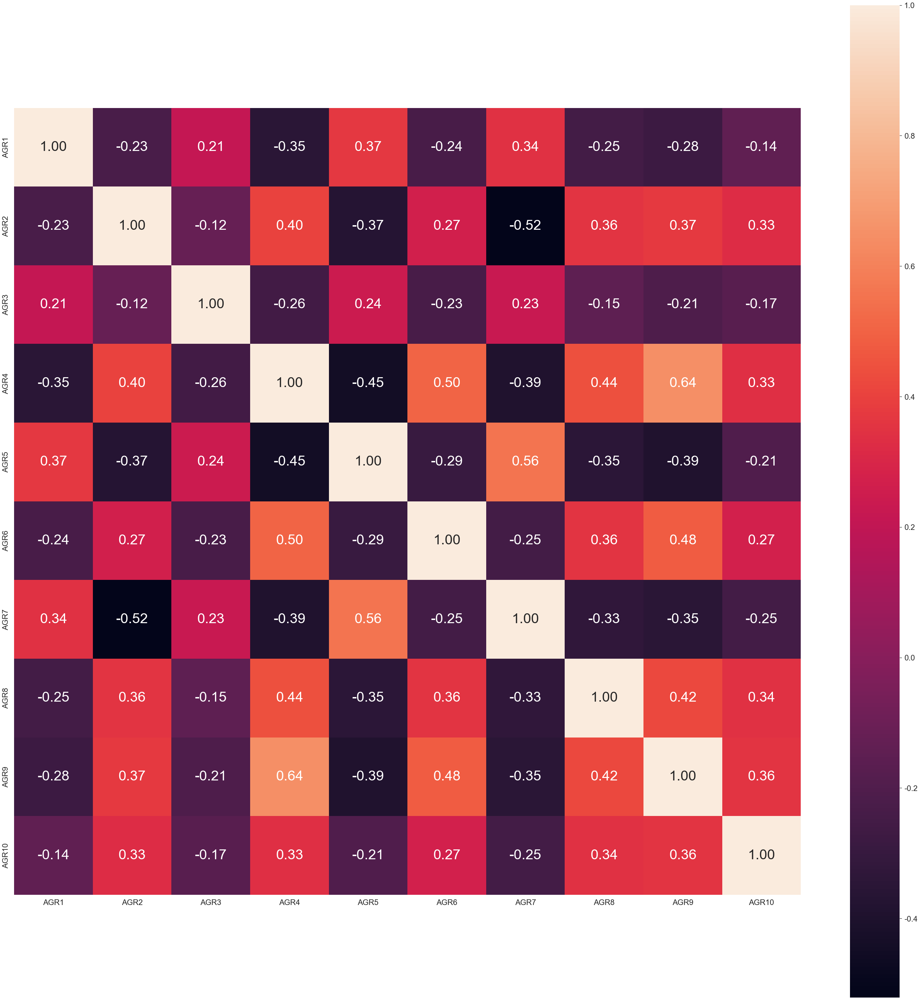

In [25]:
vis_corr(AGR)

In [26]:
[question[CSN].corr() > 0.5]

[        CSN1   CSN2   CSN3   CSN4   CSN5   CSN6   CSN7   CSN8   CSN9  CSN10
 CSN1    True  False  False  False  False  False  False  False  False  False
 CSN2   False   True  False  False  False   True  False  False  False  False
 CSN3   False  False   True  False  False  False  False  False  False  False
 CSN4   False  False  False   True  False  False  False  False  False  False
 CSN5   False  False  False  False   True  False  False  False  False  False
 CSN6   False   True  False  False  False   True  False  False  False  False
 CSN7   False  False  False  False  False  False   True  False  False  False
 CSN8   False  False  False  False  False  False  False   True  False  False
 CSN9   False  False  False  False  False  False  False  False   True  False
 CSN10  False  False  False  False  False  False  False  False  False   True]

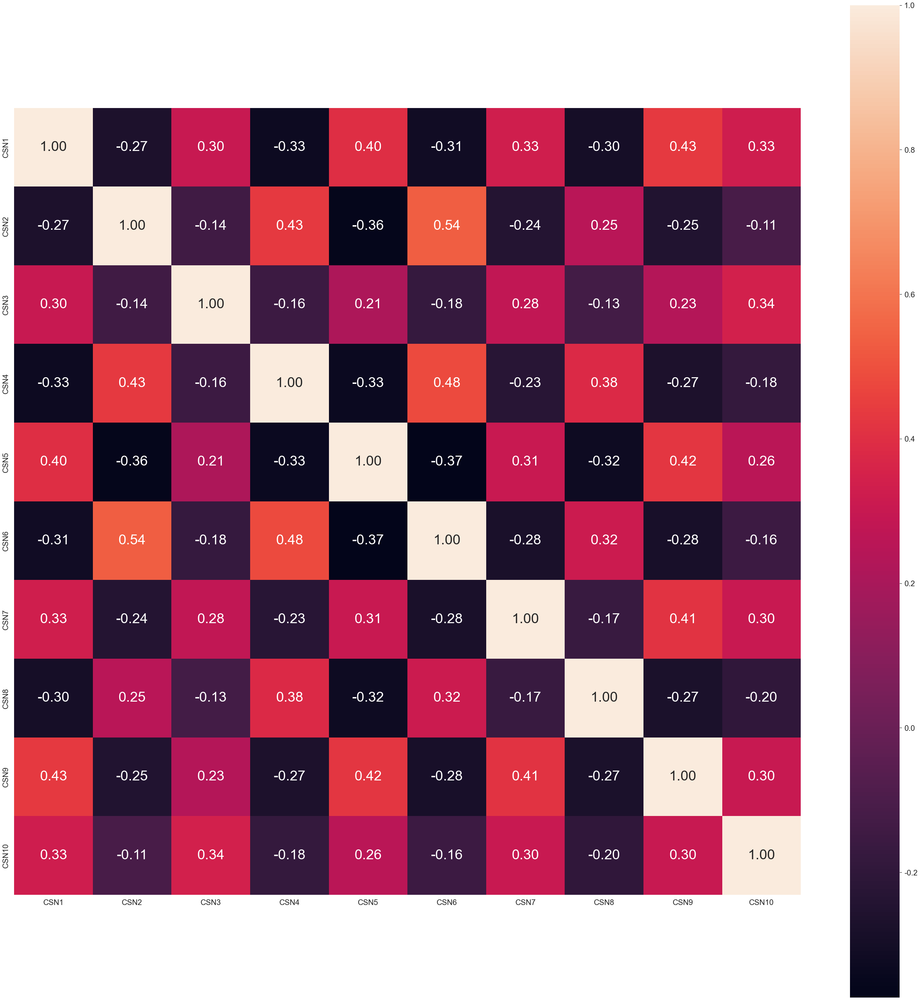

In [27]:
vis_corr(CSN)

In [28]:
[question[OPN].corr() > 0.5]

[        OPN1   OPN2   OPN3   OPN4   OPN5   OPN6   OPN7   OPN8   OPN9  OPN10
 OPN1    True  False  False  False  False  False  False   True  False  False
 OPN2   False   True  False   True  False  False  False  False  False  False
 OPN3   False  False   True  False  False  False  False  False  False  False
 OPN4   False   True  False   True  False  False  False  False  False  False
 OPN5   False  False  False  False   True  False  False  False  False   True
 OPN6   False  False  False  False  False   True  False  False  False  False
 OPN7   False  False  False  False  False  False   True  False  False  False
 OPN8    True  False  False  False  False  False  False   True  False  False
 OPN9   False  False  False  False  False  False  False  False   True  False
 OPN10  False  False  False  False   True  False  False  False  False   True]

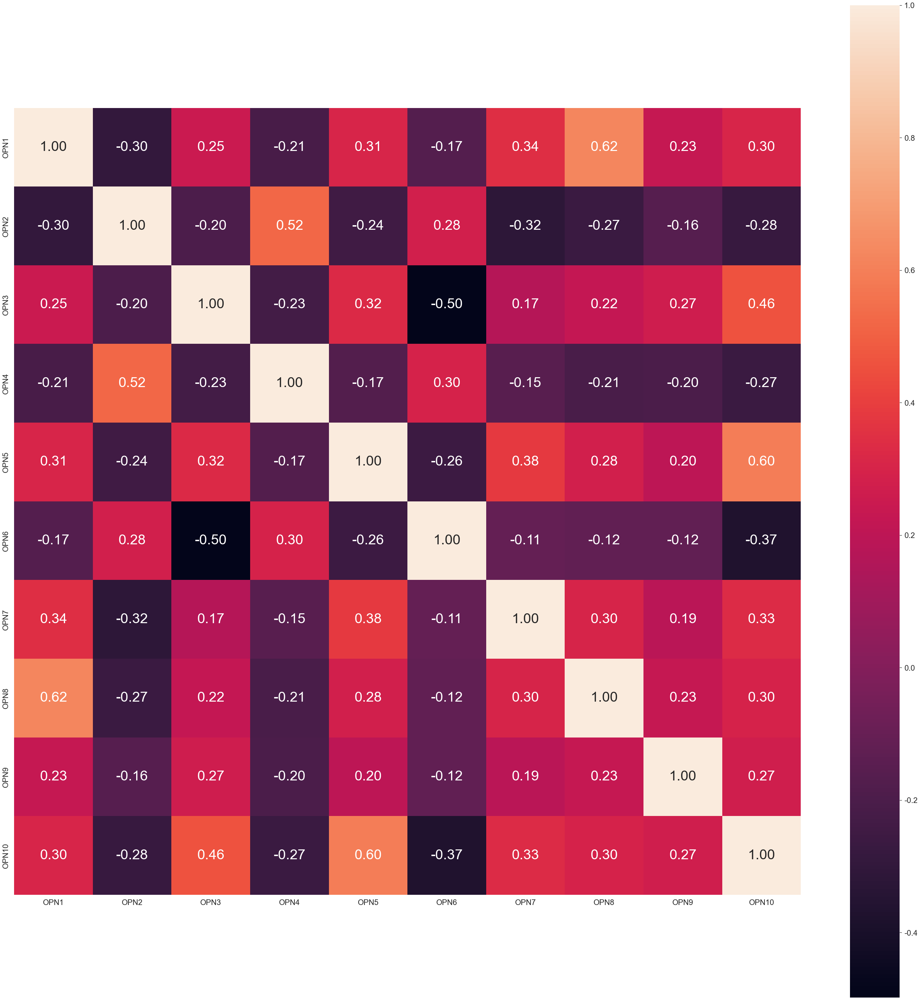

In [29]:
vis_corr(OPN)

In [30]:
df = question.iloc[:,:50]

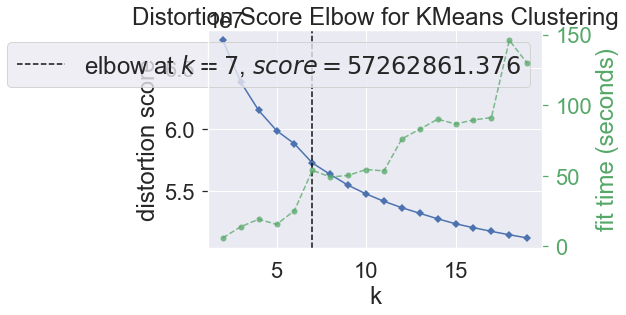

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [31]:
kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,20))
visualizer.fit(df)
visualizer.poof()

In [38]:
df_model = df

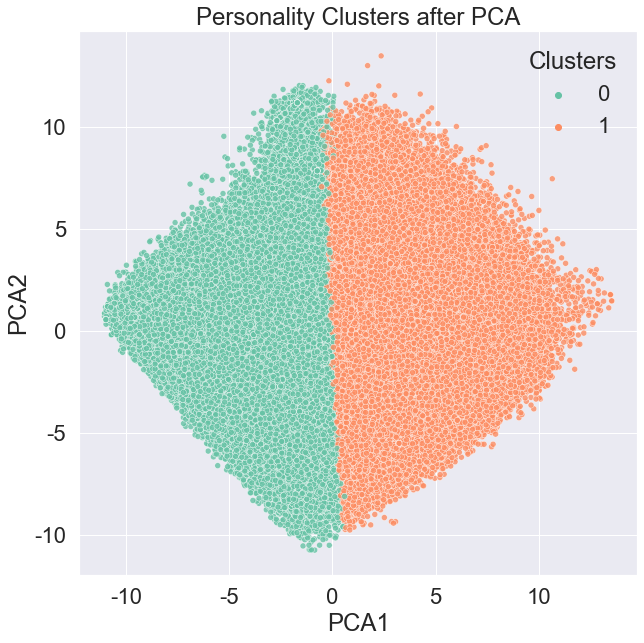

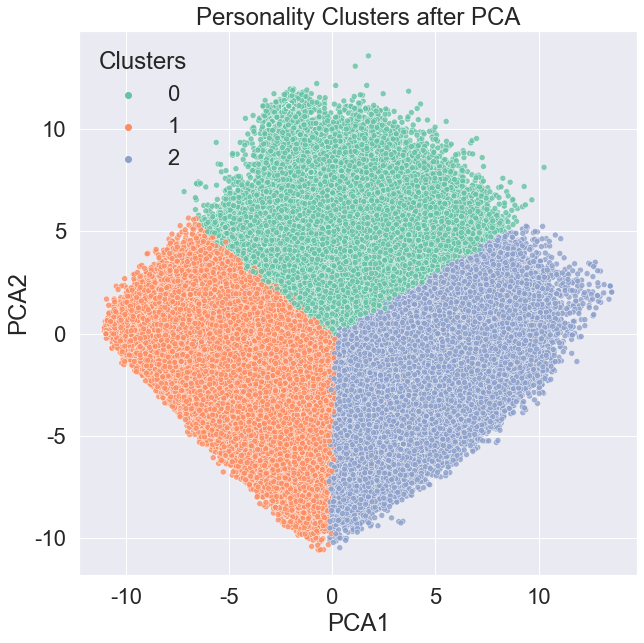

/Users/luchia/Desktop/python/miniconda3/envs/ds_study/lib/python3.8/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


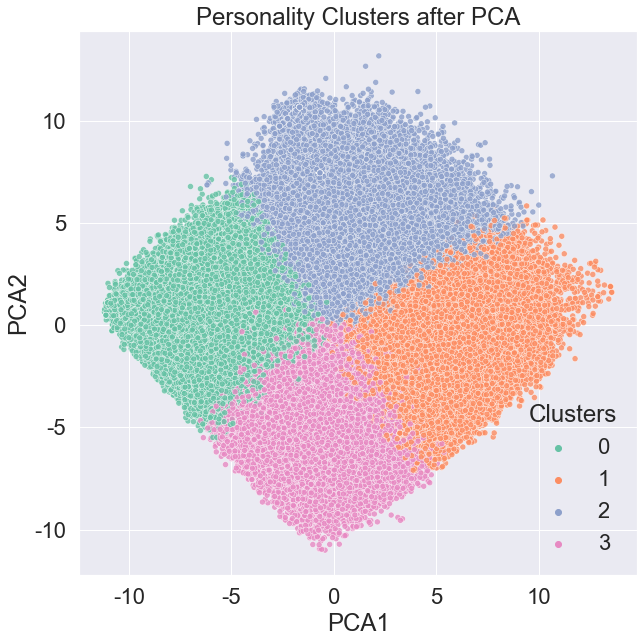

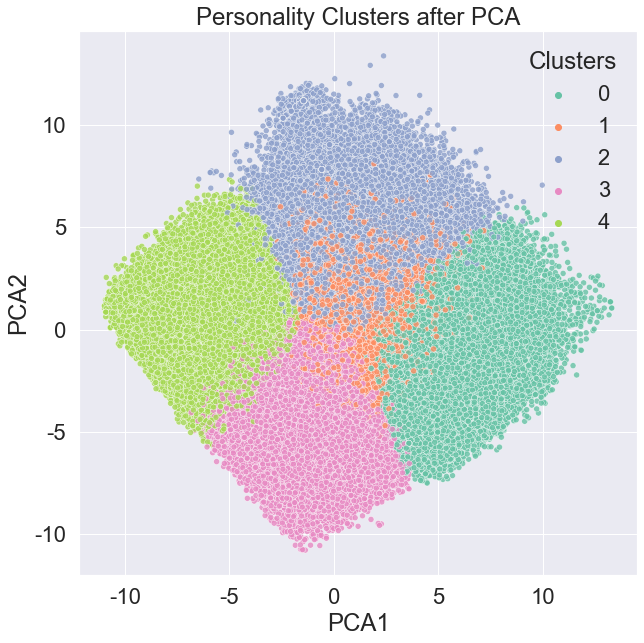

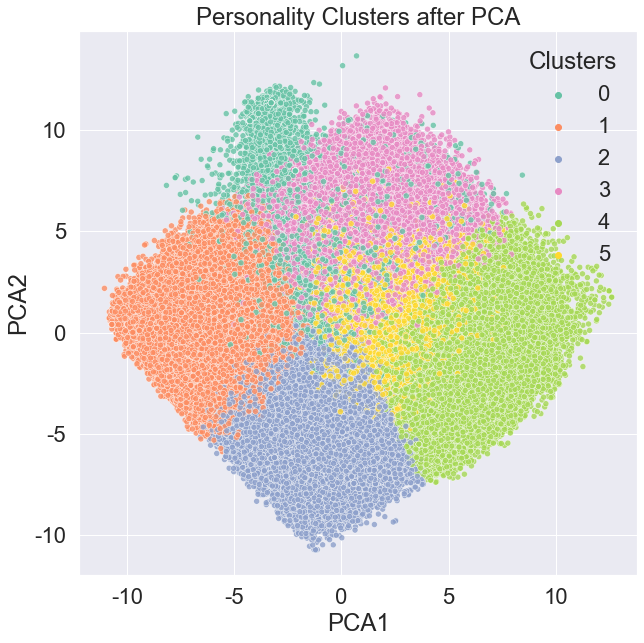

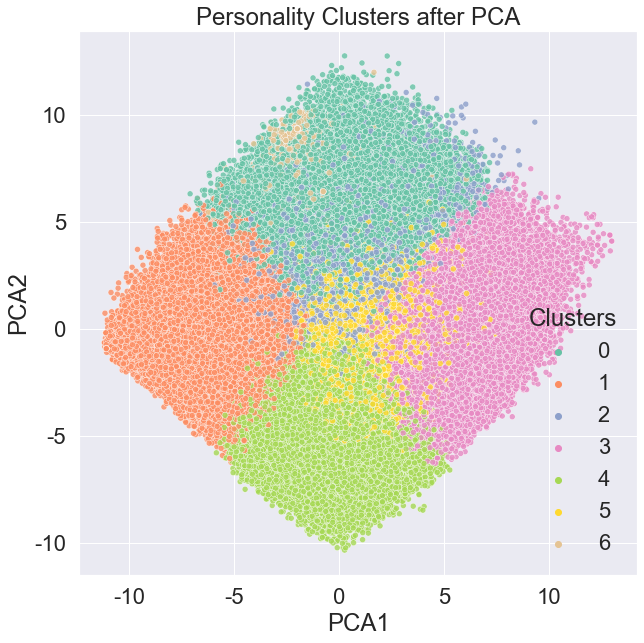

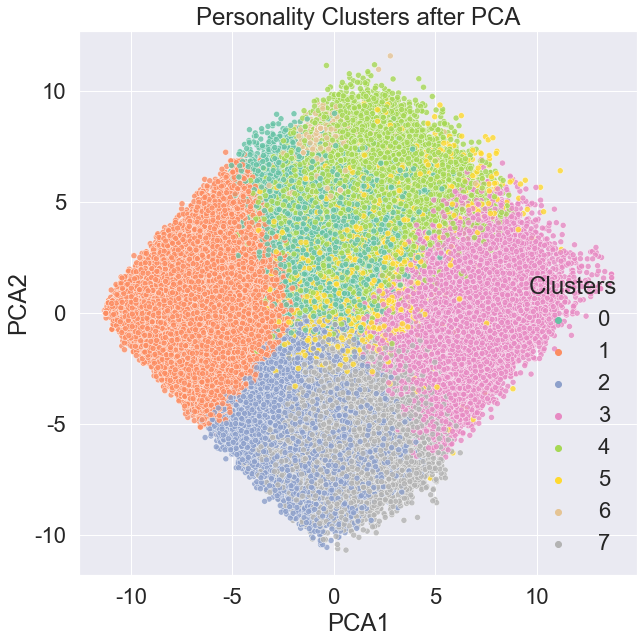

...

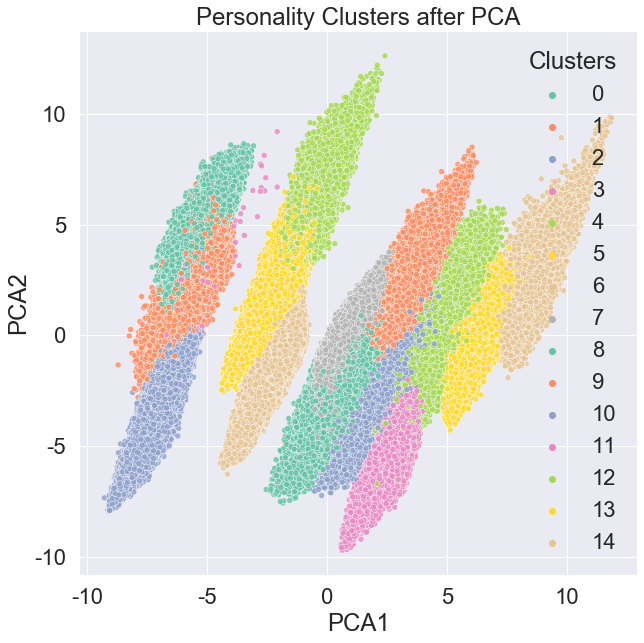

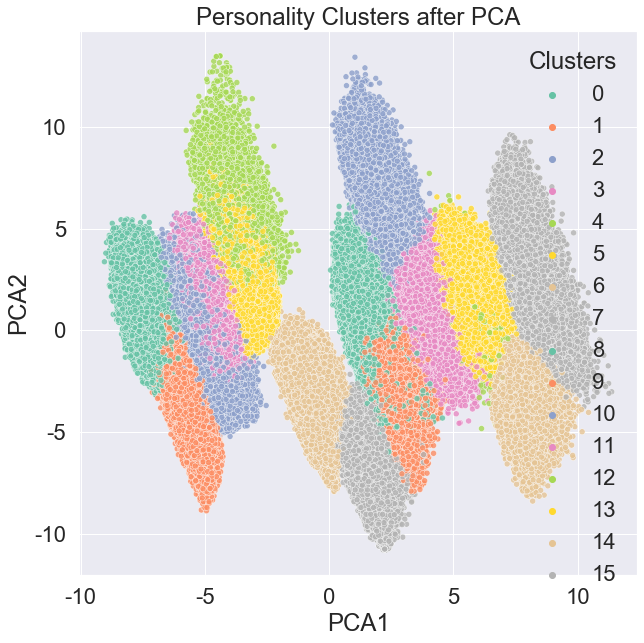

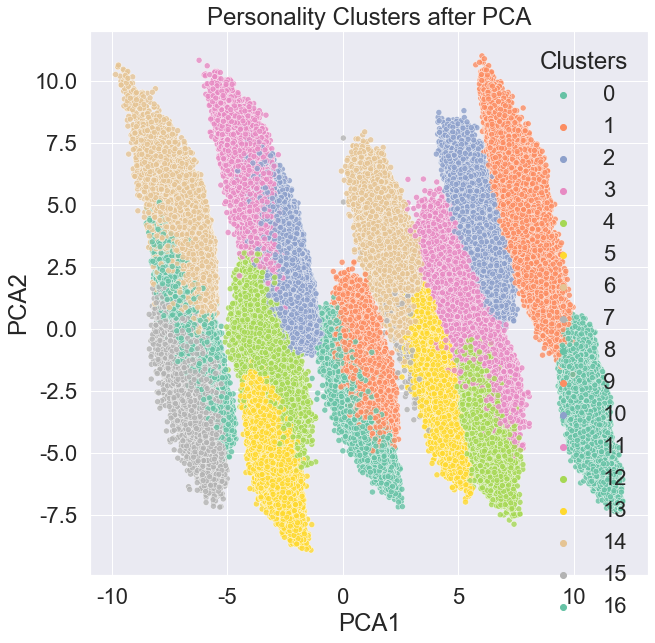

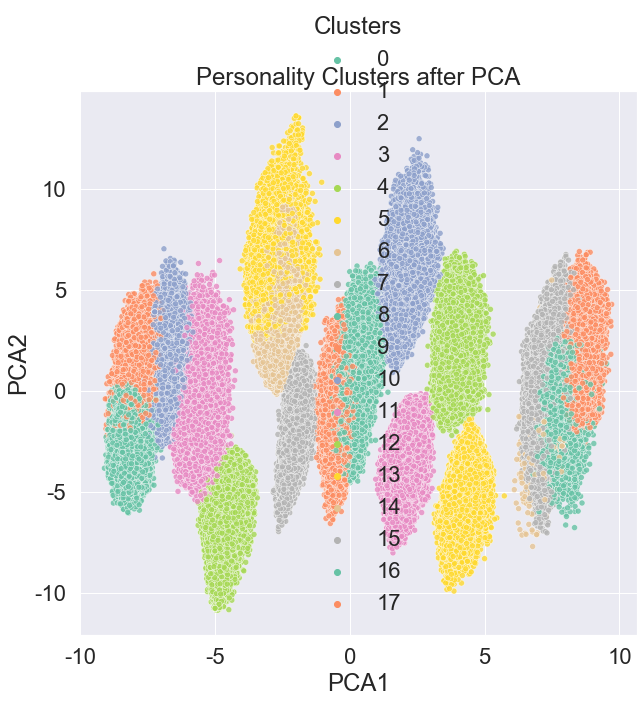

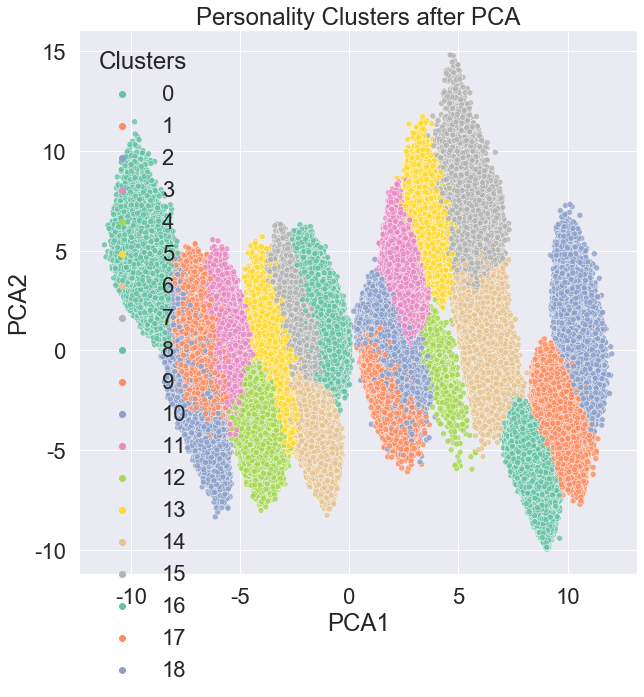

In [45]:
for i in range(2, 20):
    kmeans = KMeans(n_clusters=i)
    k_fit = kmeans.fit(df_model)
    predictions = k_fit.labels_
    df_model['Clusters'] = predictions

    df_model.Clusters.value_counts()
    df_model.groupby('Clusters').mean()

    col_list = list(df_model)
    ext = col_list[0:10]
    est = col_list[10:20]
    agr = col_list[20:30]
    csn = col_list[30:40]
    opn = col_list[40:50]

    data_sums = pd.DataFrame()
    data_sums['extroversion'] = df_model[ext].sum(axis=1)/10
    data_sums['neurotic'] = df_model[est].sum(axis=1)/10
    data_sums['agreeable'] = df_model[agr].sum(axis=1)/10
    data_sums['conscientious'] = df_model[csn].sum(axis=1)/10
    data_sums['open'] = df_model[opn].sum(axis=1)/10
    data_sums['clusters'] = predictions
    data_sums.groupby('clusters').mean()


    pca = PCA(n_components=2)
    pca_fit = pca.fit_transform(df_model)

    df_pca = pd.DataFrame(data=pca_fit, columns=['PCA1', 'PCA2'])
    df_pca['Clusters'] = predictions
    
    plt.figure(figsize=(10,10))
    sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='Clusters', palette='Set2', alpha=0.8)
    plt.title('Personality Clusters after PCA');